## Table of Contents
- [Introduction](#introduction)
- [Import libraries](#libraries)
- [Data extraction](#data_extract)
- [Data analysis](#data_analysis)
- [Data modelling](#data_model)
- [Clustering analysis](#cluster_analysis)
- [Conclusion](#conclusion)

## Introduction <a name = "introduction"/>

Wine is an alcoholic beverage enjoyed worldwide. Its diversity of flavours and styles can be the result of factors such as the levels of acids and minerals, the specific grape variety utilized, and the unique combination of soil and climate in the region where the grapes are cultivated. These factors help define the characteristics of each wine, offering a delightful and diverse experience to wine lovers everywhere.

In this lab, we take a look at the differences in wine content between 3 different manufacturers in Italy. Besides the data, we also look into exploring more visualisation tools, specifically Plotly, that can create interactive graphs. We will be using such graphs to analyse clustering patterns and how interactive graphs allow us to visualise change in model hyperparameters.

The dataset contains 178 rows and 13 features.
https://www.kaggle.com/datasets/harrywang/wine-dataset-for-clustering

<b>Lets take a look at the features</b>

<ol>
    <li><b>Alcohol</b>: Alcohol is a measurement of the amount of ethanol concentration found in wines, which is made during the fermentation process.</li>
    <li><b>Malic_Acid</b>: Malic acid is one of the main acids found in grapes. Malic acid contributes to the wine's overall acidity. Grapes that are not matured often have higher malic acidity values, giving it the sour flavour in wines.</li>
    <li><b>Ash</b>: Ash is a measurement of the inorganic mineral residues found in wines that remain after all organic matter has been completed burned during the ashing process.</li>
    <li><b>Ash_Alcanity</b>: Often referred as titratable acidity, Ash Alkalinity determines the amount of alkali required to neutralise the acid content in the wine.</li>
    <ul>
        <li>It is assumed that this feature is referring to Ash Alkalinity. Alcanity may be the native spelling referring to Alkaline.</li>
    </ul>
    <li><b>Magnesium</b>: Magnesium is a chemical is found in wines. Based on the amount of magnesium, The wine's flavour and texture varies based on the amount of magnesium.</li>
    <li><b>Total_Phenols</b>: Total phenols are the total amount of phenolic substances found in wines. Phenols may have antioxidant effects in addition to adding to the wine's flavour, texture and colour.</li>
    <li><b>Flavanoids</b>: Flavanoids are a subcategory of phenolic chemicals present in wines. They add on to the wine's flavour, colour, and other sensory qualities. Red wines are known to have high values of Flavanoids.</li>
    <li><b>Nonflavanoid_Phenols</b>: Other than phenolic chemicals, wines also contain non-flavanoid phenols. These chemicals also affect the wine's fragrance, colour and flavour.</li>
    <li><b>Proanthocyanins</b>: Proanthocyanins are flavonoid substances found in wines. They are known for their antioxidant properties and contribute to the texture and acidity of the wine.</li>
    <li><b>Color_Intensity</b>: Colour intensity is the depth and concentration of colour in wines. It is affected by the amount of pigments, such as anthocyanins and other phenolic compounds.</li>
    <li><b>Hue</b>: Hue is the tint or shade of the wine's colour. It refers to the primary colour that is seen when the wine is left examined.</li>
    <li><b>OD280</b>: OD280 or Optical Density at 280nm, is a measurement to determine the protein concentration in wines.</li>
    <li><b>Proline</b>: Proline is an amino acid that is found in grapes. The amount of proline in wines can affect the aroma and flavour of the wine. It may be also used to measure the maturity of the grapes.</li>
</ol>

## Import Libraries <a name = "libraries"/>

In [1]:
# Used for K-Means memory leak on Windows with MKL
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.cluster import MeanShift
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [3]:
# Display all rows/cols in df, enable or disable as required
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Data Extraction <a name = "data_extract"/>

In [4]:
df = pd.read_csv("wine-clustering.csv")

In [5]:
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [6]:
df.columns

Index(['Alcohol', 'Malic_Acid', 'Ash', 'Ash_Alcanity', 'Magnesium',
       'Total_Phenols', 'Flavanoids', 'Nonflavanoid_Phenols',
       'Proanthocyanins', 'Color_Intensity', 'Hue', 'OD280', 'Proline'],
      dtype='object')

In [7]:
df.shape

(178, 13)

In [73]:
# Check for any missing values
df.isna().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
Cluster_Label           0
dtype: int64

## Data Analysis <a name = "data_analysis"/>

Next, we can take a look at where the data lines when comparing to each feature. We will use the following visualising tools to analyse the correlation and distribution
- `seaborn.pairplot`: Analyses the distribution of each feature, and datapoints given 2 features.
- `pandas.DataFrame.corr`: Calculates the pearson correlation given 2 features. Pearson correlation measures the linearity strength between 2 features. It ranges from -1 to 1, with values closer to -1 or 1 as very negativly and positively correlated respectively, while values closer to 0 as no correlation.

Do note that correlation between features do not mean the strength of the features. That would be uncovered later using feature engineering techniques.

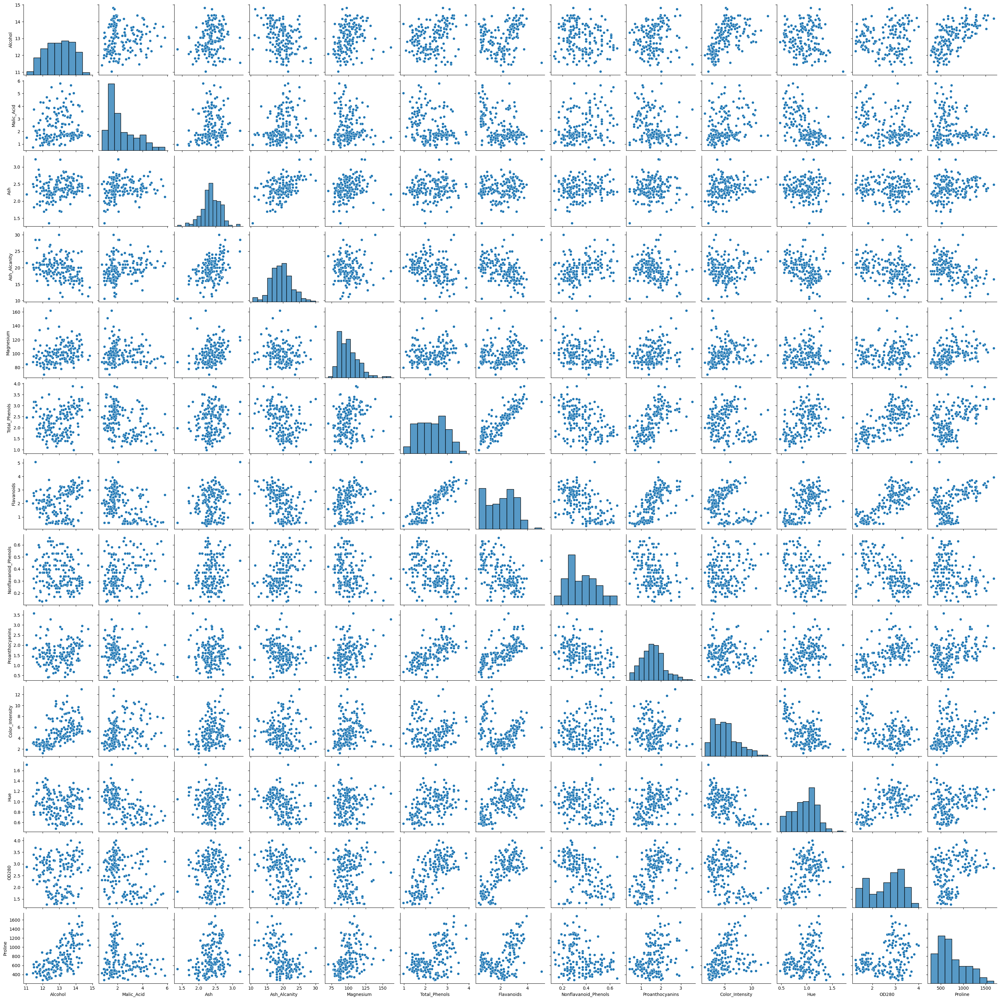

In [8]:
sns.pairplot(df)

<Axes: >

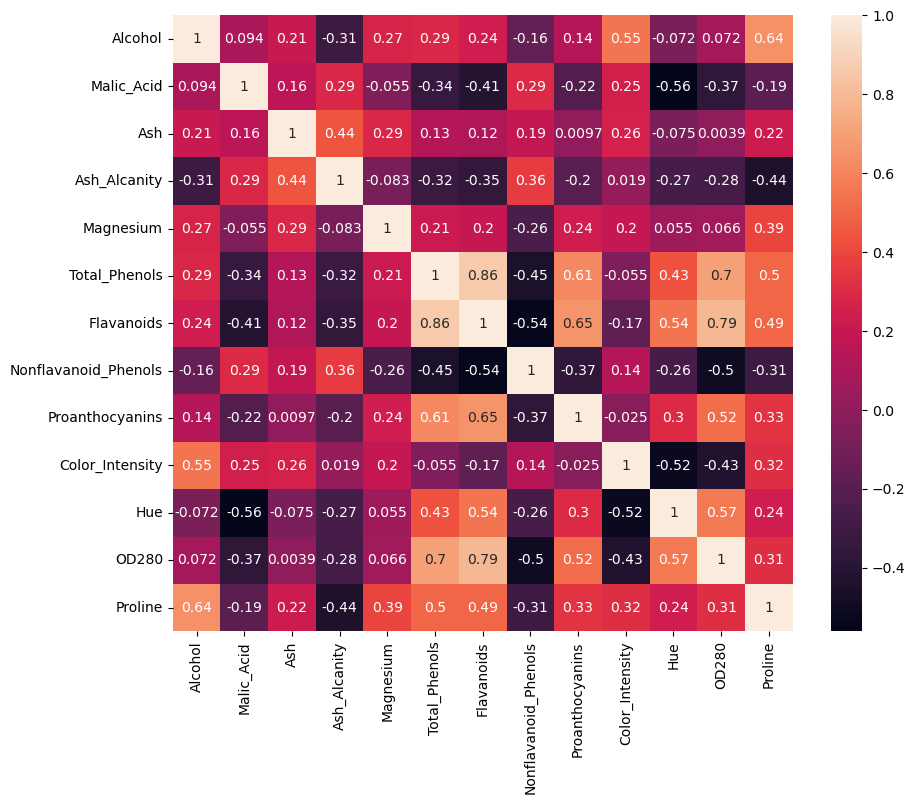

In [9]:
plt.figure(figsize = (10, 8))
sns.heatmap(df.corr(), annot = True)

In [10]:
corr_map = df.corr()

for x in range(corr_map.shape[0]):
    corr_map.iloc[x, x] = 0.0
    
corr_map_abs = corr_map.abs()

In [11]:
col_list = ["Feature", "1st", "2nd", "3rd", "4th", "5th", "6th", 
            "7th", "8th", "9th", "10th", "11th", "12th"]

corr_order_df = pd.DataFrame(columns = col_list)

for col in corr_map.index:
    # Take the order of correlation, from 1st to last, and exclude self from list
    corr_order = list(corr_map_abs.loc[col, :].sort_values(ascending = False).index[:-1])
    
    new_row = pd.DataFrame(columns = col_list, data = [[col] + corr_order])
    corr_order_df = pd.concat([corr_order_df, new_row], axis = 0).reset_index(drop = True)

<b>Inorganic/Organic compounds can be seen in/measured with</b>
- `Alcohol`
- `Ash`
- `Ash_Alcanity`

<b>Bioactive molecules and minerals found in grapes</b>
- `Total_Phenols`, `Flavanoids`, `Proanthocyanins` are positively correlated as they are chemicals related to each other.
- `Nonflavanoid_Phenols` is inversely correlated to `Total_Phenols` (-0.45), `Flavanoids` (-0.54), `Proanthocyanins` (-0.37)
- `Malic_Acid` is positively correlated to `Ash` (0.16), `Ash_Alcanity` (0.29), `Nonflavanoid_Phenols` (0.29)
- `Proline` is positively correlated to `Alcohol` (0.64), `Ash` (0.22), and the group of phenols and flavanoids `Total_Phenols` (0.5), `Flavanoids` (0.49), `Proanthocyanins` (0.33)
- `Magnesium` is positively correlated to `Alcohol` (0.27), `Ash` (0.29), `Proline` (0.39) and the group of phenols and flavanoids `Total_Phenols` (0.21), `Flavanoids` (0.2), `Proanthocyanins` (0.24)
- `Malic_Acid` (0.29) is positive correlated to but `Magnesium` (-0.26) and `Proline` (-0.31) are inversely correlated to `Nonflavanoid_Phenols`
- `OD280` is correlated with `Total_Phenols` (0.7), `Flavanoids` (0.79), `Proanthocyanins` (0.52) while inversely correlated to `Nonflavanoid_Phenols` (-0.5)

<b>Wine color and visibility</b>
- `Color_Intensity` and `Hue` are inversly correlated (-0.52)
- `Color_Intensity is positively correlated to `Alcohol` (0.55), `Malic_Acid` (0.25), `Ash` (0.26), `Nonflavanoid_Phenols` (0.14), and `Proline` (0.32)
- `Hue` is positively correlated to `Total_Phenols` (0.43), `Flavanoids` (0.54), `Proanthocyanins` (0.3), `OD280` (0.57) and Proline (0.24)
- As such, `Color_Intensity` is inversely correlated to `Total_Phenols`, `Flavanoids`, `Proanthocyanins` chemicals 

To conclude the correlation, we can see in general, the group of phenols and flavanoids are inversely correlated to non-flavanoid Phenols.

Not all organic acids may have the same relationship to its inorganic (`Ash`) or acidic measurement to neturalising alkaline counterparts (`Ash_Alcanity`). `Proline` shows a big difference in correlating both of them, with a positive correlation for `Ash`, but a negative correlation for `Ash_Alcanity`. `Proline` also shows a high correlation to determining the amount of Ethanol content in the wine (`Alochol`).

`Color_Intensity` and `Hue` are seen to be polar oppsites.

Do note that because we do not know the colour of the wine does have an impact in some of these features. Such as `Color_Intensity` and `Hue`, as well as organic compounds such as `Malic_acid`. Instead, we should analyse the correlation based on the 3 different manufacturers.

## Data Modelling <a name = "data_model"/>

### Dimensionality Reduction -> Clustering Algorithm explanation

Since we know that there are 3 manufacturers, we can just set `n_clusters = 3` into our different clustering algorithms and done! Right...?

The problem is that by doing so, we are not able to visualise the different clusters easily. We want to use the help of visualising tools to understand the different clusters more. Then again, there are 13 features, we are unable to visualise anything beyond 3-dimensional, and even looking at a 3-dimensional graph isnt as easy to analyse as compared to a 2-dimensional graph.

We will be using dimensionality reduction techniques, to reduce the number of features and visualise a 2-dimensional and 3-dimensional graph instead.

In this lab, we will take a look at a few dimensionality reduction techniques:
- Principal Component Analysis (PCA)

For each reduced dataset, we will also employ the use of our 4 clustering techniques.
- K-means
- Hierarchical Clustering
- Mean shift
- Density-Based Spatial Clustering of Applications with Noise (DBSCAN)

We can then calculate the `silhouette_score`, which is a metric used in clustering algorithms. It tells how well our data points classified within the cluster, by comparing each sample to its neighbouring clusters. Do note that in this lab, we are not going to make decisions based on the metric score. This will be discussed later in the analysis below.

### Scaling

Before we begin, it is important to scale all features to the same units of measurements, dimensionality reduction techniques may favour features with larger scales. We will be using `StandardScaler`, which takes the mean and standard deviation of all features into consideration during scaling.

In [12]:
ss = StandardScaler()
X_scaled = ss.fit_transform(df)

# Displaying df after ss
pd.DataFrame(X_scaled, columns = df.columns).head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874


We can begin our first dimensionality reduction `PCA` now that our features have been scaled

### PCA on dataset

PCA is a dimensionality reduction technique that transforms a dataset from a higher to a lower dimension, while retaining most of the information. The concept of PCA is to find a new set(s) of orthogonal vectors that is able to represent the largest possible variance in the data.

As seen earlier, having a lower dimension can also help with visualising data, simplifying the analysis.

In [13]:
pca = PCA()
pca.fit(X_scaled)

PCA()

Lets look at the `explained_variance_ratio_` to see how the number of components in PCA describes the dataset

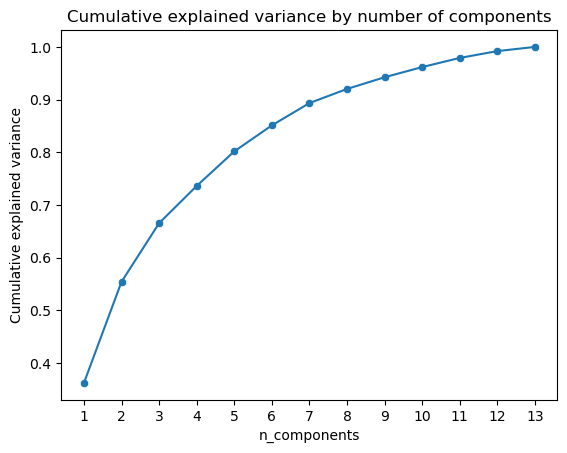

In [14]:
x_range = list(range(1, len(pca.explained_variance_ratio_) + 1))
y_range = np.cumsum(pca.explained_variance_ratio_)

ax = sns.lineplot(x = x_range, y = y_range)
sns.scatterplot(x = x_range, y = y_range, ax = ax)

plt.title("Cumulative explained variance by number of components")
plt.xlabel("n_components")
plt.xticks(x_range)
plt.ylabel("Cumulative explained variance")

plt.show()

Having 3 components explains close to 70% of the dataset! In general, it is up to us to decide the acceptable explained variance range (e.g. 50% - 70% is acceptable, 80% - 90% is very good for analysis), but for this lab, we will stick to having a maximum of 3 components for 2D and 3D visualisation 

In [15]:
pca_2d = PCA(n_components = 2, random_state = 0)
X_pca_2d = pca_2d.fit_transform(X_scaled)

pca_3d = PCA(n_components = 3, random_state = 0)
X_pca_3d = pca_3d.fit_transform(X_scaled)

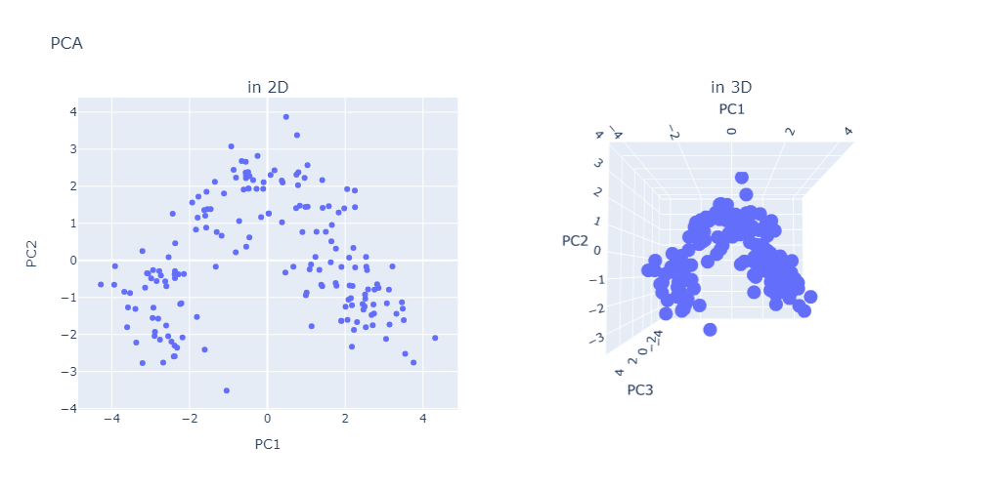

In [16]:
fig = make_subplots(cols = 2, subplot_titles = ("in 2D", "in 3D"), 
                    specs = [[{"type": "scatter"}, {"type": "scatter3d"}]])
fig.update_layout(title = "PCA", autosize = False, width = 1000, height = 500)

fig_1 = px.scatter(x = X_pca_2d[:, 0], y = X_pca_2d[:, 1])
fig.add_trace(fig_1.data[0], row = 1, col = 1)
fig.update_xaxes(title_text = "PC1", row = 1, col = 1)
fig.update_yaxes(title_text = "PC2", row = 1, col = 1)

fig_2 = px.scatter_3d(x = X_pca_3d[:, 0], y = X_pca_3d[:, 1], z = X_pca_3d[:, 2])
fig.add_trace(fig_2.data[0], row = 1, col = 2)
fig.update_scenes(xaxis = {"title_text": "PC1"},
                  yaxis = {"title_text": "PC2"},
                  zaxis = {"title_text": "PC3"},
                  row = 1, col = 2)

fig.update_layout(scene_camera = {"up": {"x": 0, "y": 0, "z": 1}, "eye": {"x": 0, "y": -0.1, "z": 2.1}})

fig

We will now begin using clustering techniques and classify them accordingly to the 3 different clusters.

### K-Means

Using K-means, the algorithm tries to find and groups data points based on their feature similarities and by the number of clusters, which is selected beforehand. The center of each cluster is a centroid, and the goal is to place the centroid in the dataset such that the average distance between the centroid and the data points within the cluster is the lowest.

To add on in finding the right clusters, We will be initialising with k-means++, as randomly initialising the starting data points may lead to local but not global optima solutions.

In [17]:
km_2d = KMeans(n_clusters = 3, init = "k-means++", n_init = 50, random_state = 0)
km_2d.fit(X_pca_2d)

clusters_2d = km_2d.predict(X_pca_2d)

In [18]:
km_3d = KMeans(n_clusters = 3, init = "k-means++", n_init = 50, random_state = 0)
km_3d.fit(X_pca_3d)

clusters_3d = km_3d.predict(X_pca_3d)

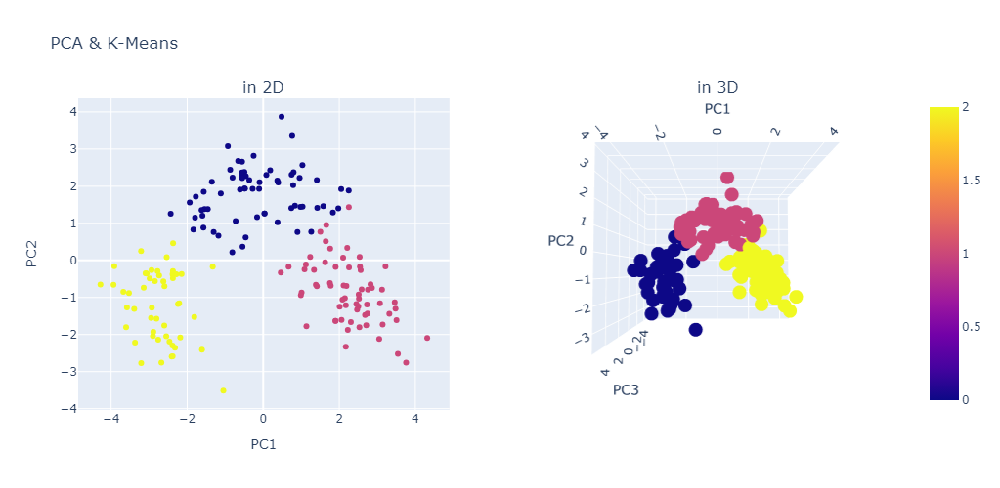

In [19]:
fig = make_subplots(cols = 2, subplot_titles = ("in 2D", "in 3D"), 
                    specs = [[{"type": "scatter"}, {"type": "scatter3d"}]])
fig.update_layout(title = "PCA & K-Means", autosize = False, width = 1000, height = 500)

fig_1 = px.scatter(x = X_pca_2d[:, 0], y = X_pca_2d[:, 1], color = clusters_2d)
fig.add_trace(fig_1.data[0], row = 1, col = 1)
fig.update_xaxes(title_text = "PC1", row = 1, col = 1)
fig.update_yaxes(title_text = "PC2", row = 1, col = 1)

fig_2 = px.scatter_3d(x = X_pca_3d[:, 0], y = X_pca_3d[:, 1], z = X_pca_3d[:, 2], color = clusters_3d)
fig.add_trace(fig_2.data[0], row = 1, col = 2)
fig.update_scenes(xaxis = {"title_text": "PC1"},
                  yaxis = {"title_text": "PC2"},
                  zaxis = {"title_text": "PC3"},
                  row = 1, col = 2)

fig.update_layout(scene_camera = {"up": {"x": 0, "y": 0, "z": 1}, "eye": {"x": 0, "y": -0.1, "z": 2.1}})

fig

In [20]:
print(clusters_2d)
print(clusters_3d)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 0 1 1 1 1 1 1 1 1 1 1 1 2
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 1 1 2 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


The clusters coloured look right for the data points, but both graphs are not having the same colour for each cluster.

As the 2 cluster labels are not labelled in the same cluster groups, we need to relabel the cluster labels so that it matches one another, as different cluster groups may result in different colours in our visualisation plots.

In [21]:
def Reorder_cluster_labels(cluster_np):
    noise_label = False
    
    cluster_label, cluster_order = np.unique(cluster_np, return_index = True)
    cluster_label = list(cluster_label)
    cluster_order = list(cluster_order)
    
    main_cluster_labels = cluster_label
    main_cluster_order = cluster_order
    
    # For cluster algorithms that classify noise
    if -1 in main_cluster_labels:
        noise_label = True
        
        main_cluster_order.pop(main_cluster_labels.index(-1))
        main_cluster_labels.remove(-1)
        
    if main_cluster_order == sorted(main_cluster_order):
        return cluster_np
    else:
        unordered_cluster_label = [cluster_np[order] for order in sorted(cluster_order)]
        ordered_cluster_np = np.zeros(shape = cluster_np.shape, dtype = np.int64)
        
        for correct_label_index, incorrect_label_value in enumerate(unordered_cluster_label):
            ordered_cluster_np[cluster_np == incorrect_label_value] = correct_label_index
        
        # Relabel noise labels back to the new numpy array (ordered_cluster_np)
        if noise_label:
            ordered_cluster_np[cluster_np == -1] = -1
            
        return ordered_cluster_np

In [22]:
clusters_2d = Reorder_cluster_labels(clusters_2d)
clusters_2d

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2], dtype=int64)

In [23]:
clusters_3d = Reorder_cluster_labels(clusters_3d)
clusters_3d

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2], dtype=int64)

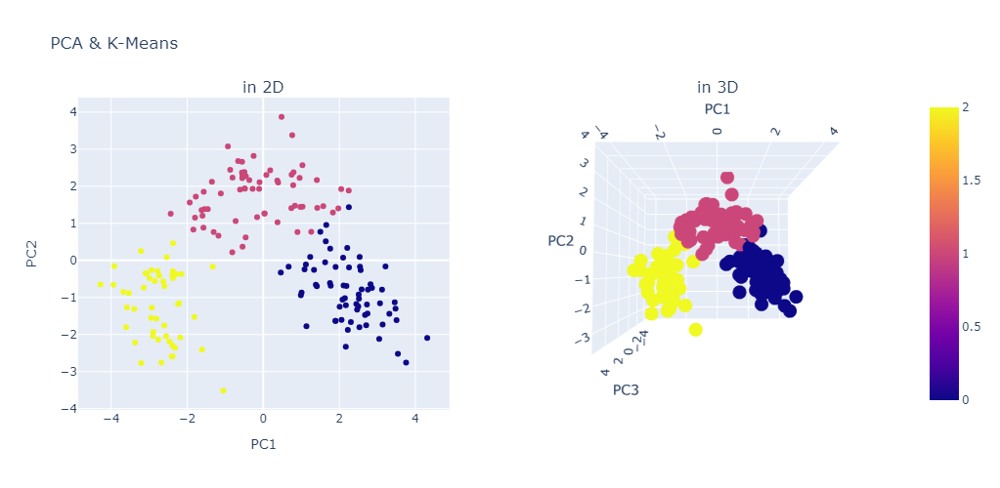

In [24]:
fig = make_subplots(cols = 2, subplot_titles = ("in 2D", "in 3D"), 
                    specs = [[{"type": "scatter"}, {"type": "scatter3d"}]])
fig.update_layout(title = "PCA & K-Means", autosize = False, width = 1000, height = 500)

fig_1 = px.scatter(x = X_pca_2d[:, 0], y = X_pca_2d[:, 1], color = clusters_2d)
fig.add_trace(fig_1.data[0], row = 1, col = 1)
fig.update_xaxes(title_text = "PC1", row = 1, col = 1)
fig.update_yaxes(title_text = "PC2", row = 1, col = 1)

fig_2 = px.scatter_3d(x = X_pca_3d[:, 0], y = X_pca_3d[:, 1], z = X_pca_3d[:, 2], color = clusters_3d)
fig.add_trace(fig_2.data[0], row = 1, col = 2)
fig.update_scenes(xaxis = {"title_text": "PC1"},
                  yaxis = {"title_text": "PC2"},
                  zaxis = {"title_text": "PC3"},
                  row = 1, col = 2)

fig.update_layout(scene_camera = {"up": {"x": 0, "y": 0, "z": 1}, "eye": {"x": 0, "y": -0.1, "z": 2.1}})

fig

We can also take a look at our metric `silhouette_score` for the models

In [25]:
sil_score_2d = silhouette_score(X_pca_2d, km_2d.labels_).round(2)
print(f"Silhouette Score for PCA 2D & KMeans: {sil_score_2d}")

sil_score_3d = silhouette_score(X_pca_3d, km_3d.labels_).round(2)
print(f"Silhouette Score for PCA 3D & KMeans: {sil_score_3d}")

Silhouette Score for PCA 2D & KMeans: 0.56
Silhouette Score for PCA 3D & KMeans: 0.45


We will also create a pandas dataframe to store the cluster labels for each dimensionality reduction, clustering algorithm, and all the cluster labels for the 178 wines.

In [26]:
result_df_columns = ["Dimensionality Reduction Technique", "Clustering Algorithm", "Silhouette Score"] + [f"For {index}" for index in list(range(0, df.shape[0]))]
result_df = pd.DataFrame(columns = result_df_columns)
result_df

,Dimensionality Reduction Technique,Clustering Algorithm,Silhouette Score,For 0,For 1,For 2,For 3,For 4,For 5,For 6,For 7,For 8,For 9,For 10,For 11,For 12,For 13,For 14,For 15,For 16,For 17,For 18,For 19,For 20,For 21,For 22,For 23,For 24,For 25,For 26,For 27,For 28,For 29,For 30,For 31,For 32,For 33,For 34,For 35,For 36,For 37,For 38,For 39,For 40,For 41,For 42,For 43,For 44,For 45,For 46,For 47,For 48,For 49,For 50,For 51,For 52,For 53,For 54,For 55,For 56,For 57,For 58,For 59,For 60,For 61,For 62,For 63,For 64,For 65,For 66,For 67,For 68,For 69,For 70,For 71,For 72,For 73,For 74,For 75,For 76,For 77,For 78,For 79,For 80,For 81,For 82,For 83,For 84,For 85,For 86,For 87,For 88,For 89,For 90,For 91,For 92,For 93,For 94,For 95,For 96,For 97,For 98,For 99,For 100,For 101,For 102,For 103,For 104,For 105,For 106,For 107,For 108,For 109,For 110,For 111,For 112,For 113,For 114,For 115,For 116,For 117,For 118,For 119,For 120,For 121,For 122,For 123,For 124,For 125,For 126,For 127,For 128,For 129,For 130,For 131,For 132,For 133,For 134,For 135,For 136,For 137,For 138,For 139,For 140,For 141,For 142,For 143,For 144,For 145,For 146,For 147,For 148,For 149,For 150,For 151,For 152,For 153,For 154,For 155,For 156,For 157,For 158,For 159,For 160,For 161,For 162,For 163,For 164,For 165,For 166,For 167,For 168,For 169,For 170,For 171,For 172,For 173,For 174,For 175,For 176,For 177


In [27]:
new_row = pd.DataFrame(data = [["PCA 2D", "K-Means", sil_score_2d] + list(clusters_2d)], columns = result_df_columns)
result_df = pd.concat([result_df, new_row]).reset_index(drop = True)

new_row = pd.DataFrame(data = [["PCA 3D", "K-Means", sil_score_3d] + list(clusters_3d)], columns = result_df_columns)
result_df = pd.concat([result_df, new_row]).reset_index(drop = True)

In [28]:
result_df

,Dimensionality Reduction Technique,Clustering Algorithm,Silhouette Score,For 0,For 1,For 2,For 3,For 4,For 5,For 6,For 7,For 8,For 9,For 10,For 11,For 12,For 13,For 14,For 15,For 16,For 17,For 18,For 19,For 20,For 21,For 22,For 23,For 24,For 25,For 26,For 27,For 28,For 29,For 30,For 31,For 32,For 33,For 34,For 35,For 36,For 37,For 38,For 39,For 40,For 41,For 42,For 43,For 44,For 45,For 46,For 47,For 48,For 49,For 50,For 51,For 52,For 53,For 54,For 55,For 56,For 57,For 58,For 59,For 60,For 61,For 62,For 63,For 64,For 65,For 66,For 67,For 68,For 69,For 70,For 71,For 72,For 73,For 74,For 75,For 76,For 77,For 78,For 79,For 80,For 81,For 82,For 83,For 84,For 85,For 86,For 87,For 88,For 89,For 90,For 91,For 92,For 93,For 94,For 95,For 96,For 97,For 98,For 99,For 100,For 101,For 102,For 103,For 104,For 105,For 106,For 107,For 108,For 109,For 110,For 111,For 112,For 113,For 114,For 115,For 116,For 117,For 118,For 119,For 120,For 121,For 122,For 123,For 124,For 125,For 126,For 127,For 128,For 129,For 130,For 131,For 132,For 133,For 134,For 135,For 136,For 137,For 138,For 139,For 140,For 141,For 142,For 143,For 144,For 145,For 146,For 147,For 148,For 149,For 150,For 151,For 152,For 153,For 154,For 155,For 156,For 157,For 158,For 159,For 160,For 161,For 162,For 163,For 164,For 165,For 166,For 167,For 168,For 169,For 170,For 171,For 172,For 173,For 174,For 175,For 176,For 177
0,PCA 2D,K-Means,0.56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1,PCA 3D,K-Means,0.45,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2


We should also create helper functions to help facilitate the modelling and analysis process

In [29]:
def fit_model(model, hpararms, data):
    model.set_params(**hpararms)
    
    clusters = model.fit_predict(data)
    
    return (model, clusters)

In [30]:
def display_2d_3d_graphs(data_2d, data_3d, cluster_labels_2d, cluster_labels_3d,
                         fig_title):
    fig = make_subplots(cols = 2, subplot_titles = ("in 2D", "in 3D"), 
                        specs = [[{"type": "scatter"}, {"type": "scatter3d"}]])
    fig.update_layout(title = fig_title, autosize = False, width = 1000, height = 500)

    fig_1 = px.scatter(x = data_2d[:, 0], y = data_2d[:, 1], color = cluster_labels_2d)
    fig.add_trace(fig_1.data[0], row = 1, col = 1)
    fig.update_xaxes(title_text = "PC1", row = 1, col = 1)
    fig.update_yaxes(title_text = "PC2", row = 1, col = 1)

    fig_2 = px.scatter_3d(x = data_3d[:, 0], y = data_3d[:, 1], z = data_3d[:, 2], color = cluster_labels_3d)
    fig.add_trace(fig_2.data[0], row = 1, col = 2)
    fig.update_scenes(xaxis = {"title_text": "PC1"},
                      yaxis = {"title_text": "PC2"},
                      zaxis = {"title_text": "PC3"},
                      row = 1, col = 2)

    fig.update_layout(scene_camera = {"up": {"x": 0, "y": 0, "z": 1}, "eye": {"x": 0, "y": -0.1, "z": 2.1}})

    fig.show()

In [31]:
def compute_sil_score(data, model):
    return silhouette_score(data, model.labels_).round(2)

In [32]:
'''
drt - Dimensionality Reduction Technique
ca - Clustering Algorithm
sil_score - Silhouette score of drt + ca
'''
def store_data_df(result_df, drt, ca, sil_score, cluster_labels):
    new_row = pd.DataFrame(data = [[drt, ca, sil_score] + list(cluster_labels)], columns = result_df.columns)
    result_df = pd.concat([result_df, new_row]).reset_index(drop = True)
    
    return result_df

### Hierarchical Clustering

Hierarchical Clustering algorithm aims in grouping similar data points together by proximity distances.

We will be using the `AgglomerativeClustering` library from sklearn to create our hierarchical clustering model. We will also set 2 hyperparameters to the following:
- <b>linkage</b>: `ward`
    - Minimises distance between cluster variance, resulting in spherical clusters
- <b>compute_full_tree</b>: `True`
    - Allows us to create a dendrogram for analysis

In [33]:
ag_2d, ag_clusters_2d = fit_model(AgglomerativeClustering(), {"n_clusters": 3, "linkage": "ward", "compute_full_tree": True}, X_pca_2d)
ag_clusters_2d = Reorder_cluster_labels(ag_clusters_2d)

ag_3d, ag_clusters_3d = fit_model(AgglomerativeClustering(), {"n_clusters": 3, "linkage": "ward", "compute_full_tree": True}, X_pca_3d)
ag_clusters_3d = Reorder_cluster_labels(ag_clusters_3d)

We can create a dendrogram as shown below

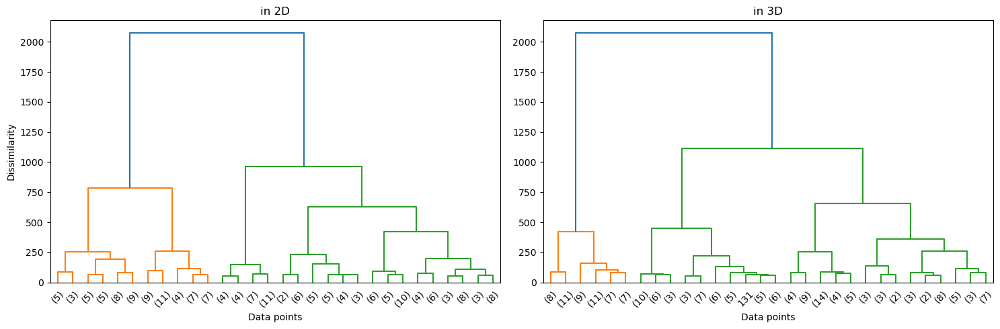

In [34]:
fig, (ax_2d, ax_3d) = plt.subplots(ncols = 2, figsize = (15, 5))

hierarchy.dendrogram(hierarchy.linkage(ag_2d.children_, method = "ward"), 
                     orientation = "top", p = 30, truncate_mode = "lastp",
                     show_leaf_counts = True, ax = ax_2d)

ax_2d.set(title = "in 2D", xlabel = "Data points", ylabel = "Dissimilarity")

hierarchy.dendrogram(hierarchy.linkage(ag_3d.children_, method = "ward"), 
                     orientation = "top", p = 30, truncate_mode = "lastp",
                     show_leaf_counts = True, ax = ax_3d)

ax_3d.set(title = "in 3D", xlabel = "Data points")

plt.tight_layout()
plt.show()

Both PCA 2D and PCA 3D converges into 3 clusters, with a dissimilarity score of about 750.

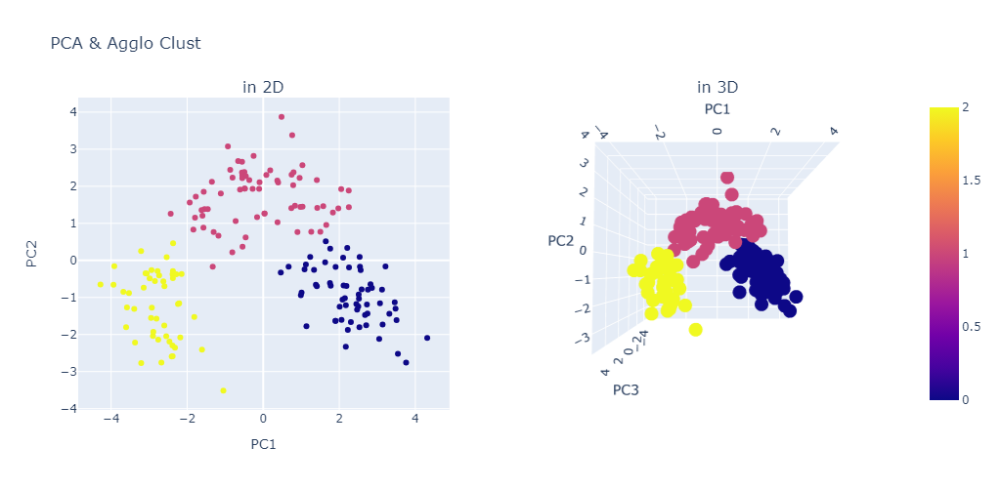

In [35]:
display_2d_3d_graphs(X_pca_2d, X_pca_3d, ag_clusters_2d, ag_clusters_3d, fig_title = "PCA & Agglo Clust")

In [36]:
sil_score_2d = compute_sil_score(X_pca_2d, ag_2d)
print(f"Silhouette Score for PCA 2D & AggloClust: {sil_score_2d}")

Silhouette Score for PCA 2D & AggloClust: 0.56


In [37]:
sil_score_3d = compute_sil_score(X_pca_3d, ag_3d)
print(f"Silhouette Score for PCA 3D & AggloClust: {sil_score_3d}")

Silhouette Score for PCA 3D & AggloClust: 0.45


In [38]:
result_df = store_data_df(result_df, "PCA 2D", "AggloClust", sil_score_2d, ag_clusters_2d)
result_df = store_data_df(result_df, "PCA 3D", "AggloClust", sil_score_3d, ag_clusters_3d)

### Mean Shift

Mean Shift and DBSCAN are density-based algorithms, which tries to cluster data points based on density. They do not use the `number of clusters` as a hyperparameter to find the different clusters, but use distance metrics and kernels to find data points at high density regions.

For Mean Shift, flat kernels are used to discover clusters, by moving the kernel towards data points that are in high density regions.

One of the hyperparameters we will be tuning is `bandwidth`. `bandwidth` affects the size of the kernel used for density estimate calculations. It adjusts the size of the area surrounding each data point where the density is then calculated.

We will be using `estimate_bandwidth` library from sklearn, to estimate the value for the `bandwidth` hyperparameter. 

In [39]:
ms_2d, ms_clusters_2d = fit_model(MeanShift(), {"bandwidth": estimate_bandwidth(X_pca_2d)}, X_pca_2d)
ms_clusters_2d = Reorder_cluster_labels(ms_clusters_2d)

ms_3d, ms_clusters_3d = fit_model(MeanShift(), {"bandwidth": estimate_bandwidth(X_pca_3d)}, X_pca_3d)
ms_clusters_3d = Reorder_cluster_labels(ms_clusters_3d)

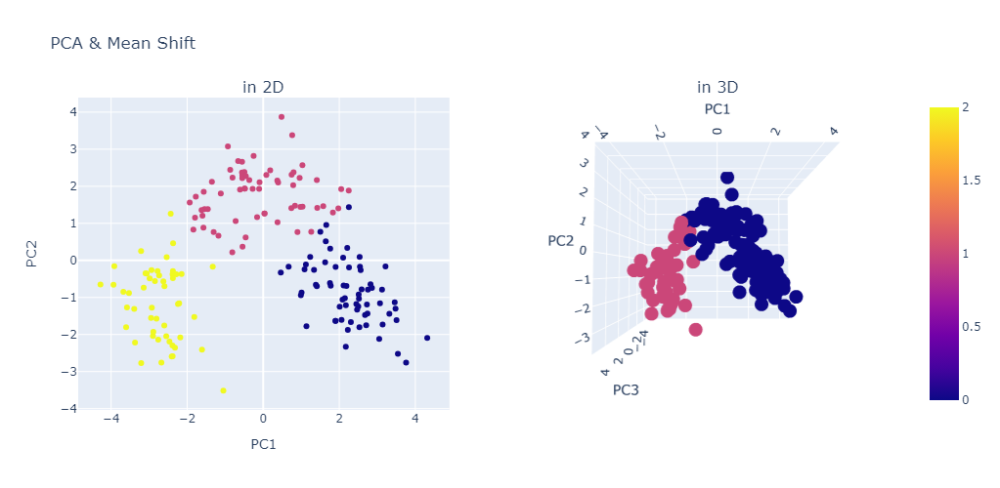

In [40]:
display_2d_3d_graphs(X_pca_2d, X_pca_3d, ms_clusters_2d, ms_clusters_3d, fig_title = "PCA & Mean Shift")

In [41]:
print(f"The different classes in 2D: {np.unique(ms_clusters_2d)}")
print(f"The estimated bandwidth calculated in 2D: {estimate_bandwidth(X_pca_2d)}")

print()

print(f"The different classes in 3D: {np.unique(ms_clusters_3d)}")
print(f"The estimated bandwidth calculated in 3D: {estimate_bandwidth(X_pca_3d)}")

The different classes in 2D: [0 1 2]
The estimated bandwidth calculated in 2D: 2.186490959198684

The different classes in 3D: [0 1]
The estimated bandwidth calculated in 3D: 2.7896422491483532


There are 3 clusters seen in PCA 2D but 2 clusters seen in PCA 3D. We know that there should be 3 clusters as there are 3 different manufacturers.

Lets see if we can tune `bandwidth` to see if we can make PCA 3D have 3 clusters. We will be looking at bandwidths from 1.0 to 3.0, with an interval of 0.05

In [42]:
'''
model - The model used, either Mean Shift or DBSCAN
hparam - Either bandwidth (for Mean Shift) or epsilon (for DBSCAN)
hparam_range - Range of values used to tune hparam
data - The dataset after dimensionality reduction (e.g. X_pca_2d, X_pca_3d)
n_dims - Number of dimensions in data
'''
def model_analyser(model, hparam, hparam_range, data, n_dims):
    cluster_labels_list = []
    
    for hparam_value in hparam_range:
        _, cluster_labels = fit_model(model, {hparam: hparam_value}, data)        
        cluster_labels = Reorder_cluster_labels(cluster_labels)

        cluster_labels_list.append(cluster_labels)
        test_value = True

    # Create figure
    fig = go.Figure()

    for cluster_labels in cluster_labels_list:
        if n_dims == 2:
            fig_px = px.scatter(x = data[:, 0], y = data[:, 1], color = cluster_labels)
        elif n_dims == 3:
            fig_px = px.scatter_3d(x = data[:, 0], y = data[:, 1], z = data[:, 2], color = cluster_labels)
            
        fig.add_trace(fig_px.data[0])

    steps = []
    for i in range(len(fig.data)):
        step = dict(method = "update", label = hparam_range[i],
                    args = [{"visible": [False] * len(fig.data)}])
        step["args"][0]["visible"][i] = True
        steps.append(step)

    sliders = [dict(active = 7, currentvalue = {"prefix": f"{hparam}: "},
                    pad = {"t": 50}, steps = steps)]
    fig.update_layout(sliders = sliders, width = 650, height = 600)

    fig.show()

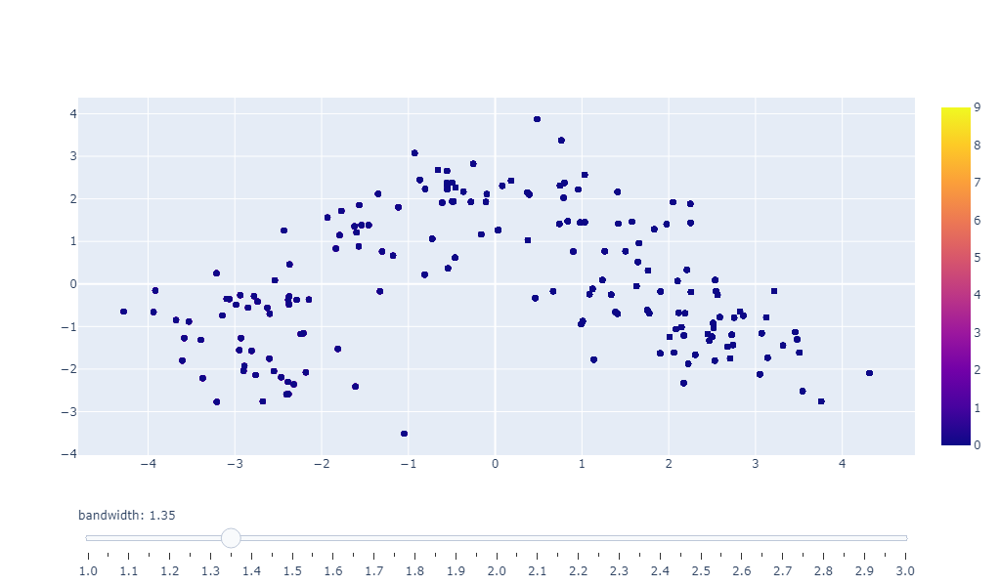

In [43]:
model_analyser(MeanShift(), "bandwidth", np.arange(1, 3.05, 0.05).round(2), X_pca_2d, n_dims = 2)

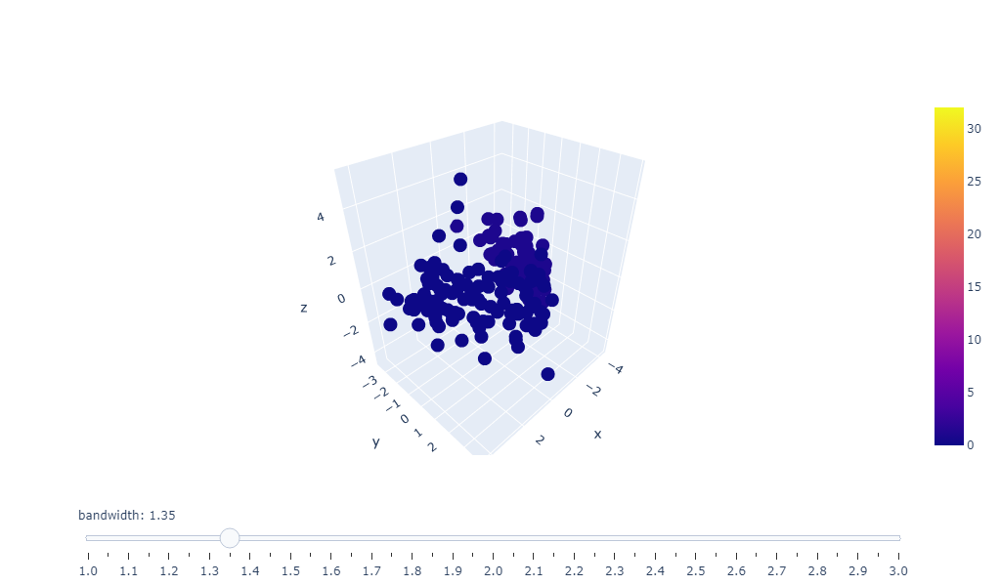

In [44]:
model_analyser(MeanShift(), "bandwidth", np.arange(1, 3.05, 0.05).round(2), X_pca_3d, n_dims = 3)

It seems that for PCA 2D, there are multiple bandwidths that would fit the model in having 3 different clusters, although the data points for clusters may vary slightly. We will not change the bandwidth and take the estimated bandwidth calculated.

For PCA 3D, we can take `bandwidth = 2.7`, as it results in the model converging into 3 clusters. These clusters look similar to the ones seen in K-Means and Hierarchical Clustering.

In [45]:
ms_3d, ms_clusters_3d = fit_model(MeanShift(), {"bandwidth": 2.7}, X_pca_3d)
ms_clusters_3d = Reorder_cluster_labels(ms_clusters_3d)

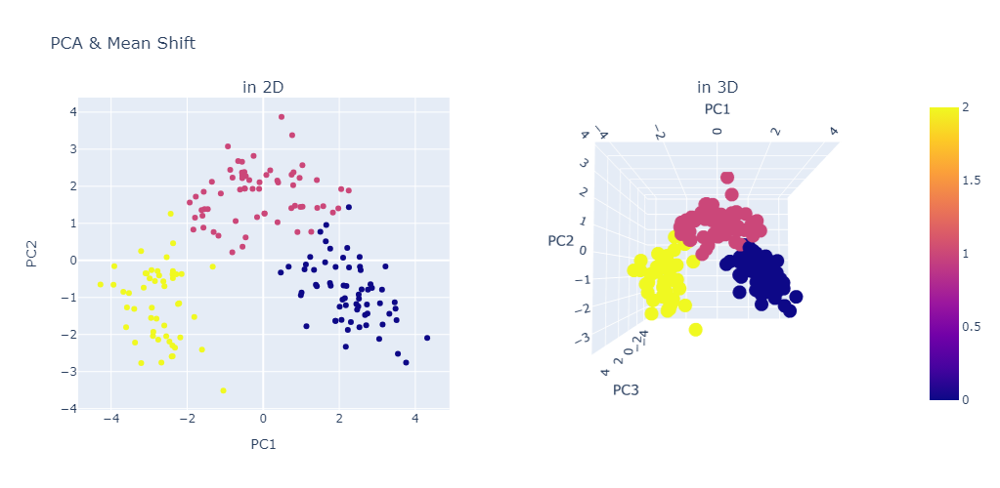

In [46]:
display_2d_3d_graphs(X_pca_2d, X_pca_3d, ms_clusters_2d, ms_clusters_3d, fig_title = "PCA & Mean Shift")

In [47]:
sil_score_2d = compute_sil_score(X_pca_2d, ms_2d)
print(f"Silhouette Score for PCA 2D & Mean Shift: {sil_score_2d}")

Silhouette Score for PCA 2D & Mean Shift: 0.56


In [48]:
sil_score_3d = compute_sil_score(X_pca_3d, ms_3d)
print(f"Silhouette Score for PCA 3D & Mean Shift: {sil_score_3d}")

Silhouette Score for PCA 3D & Mean Shift: 0.45


In [49]:
result_df = store_data_df(result_df, "PCA 2D", "Mean Shift", sil_score_2d, ms_clusters_2d)
result_df = store_data_df(result_df, "PCA 3D", "Mean Shift", sil_score_3d, ms_clusters_3d)

### DBSCAN

Another density-based algorithm we will be looking at is the Density-Based Spatial Clustering of Applications with Noise algorithm (more popularly known as DBSCAN).

Similar to Mean Shift, DBSCAN does not require the number of clusters as it tries to find dense clusters in the dataset with the help of `epsilon`. `epsilon` refers to the maximum distance between two data points for a cluster to be formed or connected to a cluster. We will be tuning `epsilon` to see how clusters form with DBSCAN.

In [50]:
dbscan_2d, dbscan_clusters_2d = fit_model(DBSCAN(), {}, X_pca_2d)
dbscan_clusters_2d = Reorder_cluster_labels(dbscan_clusters_2d)

dbscan_3d, dbscan_clusters_3d = fit_model(DBSCAN(), {}, X_pca_3d)
dbscan_clusters_3d = Reorder_cluster_labels(dbscan_clusters_3d)

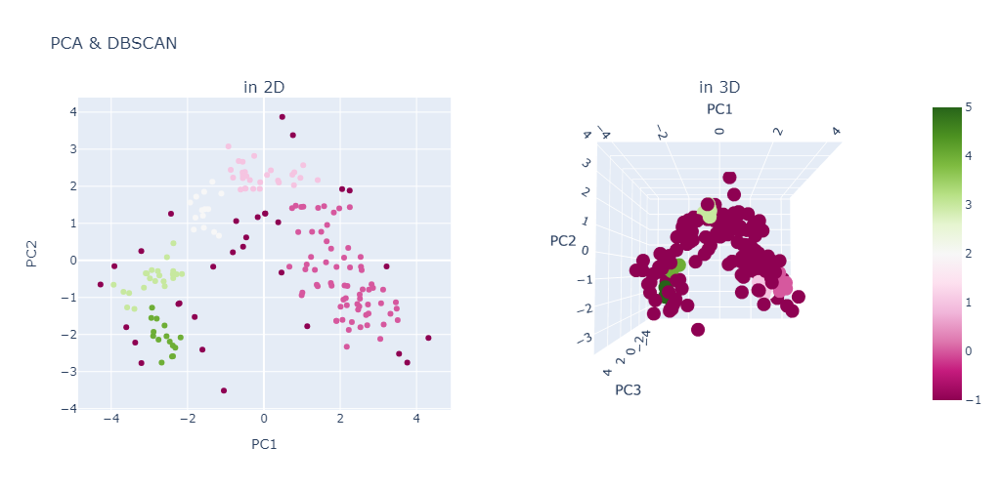

In [51]:
display_2d_3d_graphs(X_pca_2d, X_pca_3d, dbscan_clusters_2d, dbscan_clusters_3d, fig_title = "PCA & DBSCAN")

In [52]:
print(f"The different classes in 2D: {np.unique(dbscan_clusters_2d)}")
print(f"No. of outliers in 2D: {len(np.where(dbscan_clusters_2d == -1)[0])}")

print()

print(f"The different classes in 3D: {np.unique(dbscan_clusters_3d)}")
print(f"No. of outliers in 3D: {len(np.where(dbscan_clusters_3d == -1)[0])}")

The different classes in 2D: [-1  0  1  2  3  4]
No. of outliers in 2D: 31

The different classes in 3D: [-1  0  1  2  3  4  5]
No. of outliers in 3D: 139


Without any hyperparameter tuning, we can see that both models output a different number of clusters, similar to what Mean Shift has done initally.
There is also a large number of noise $\frac{139}{178} = 78\%$ seen in PCA 3D.

We will have to tune the epsilon value to change it to 3 clusters. We will be looking at epsilon from 0.05 to 1.0, with an interval of 0.05

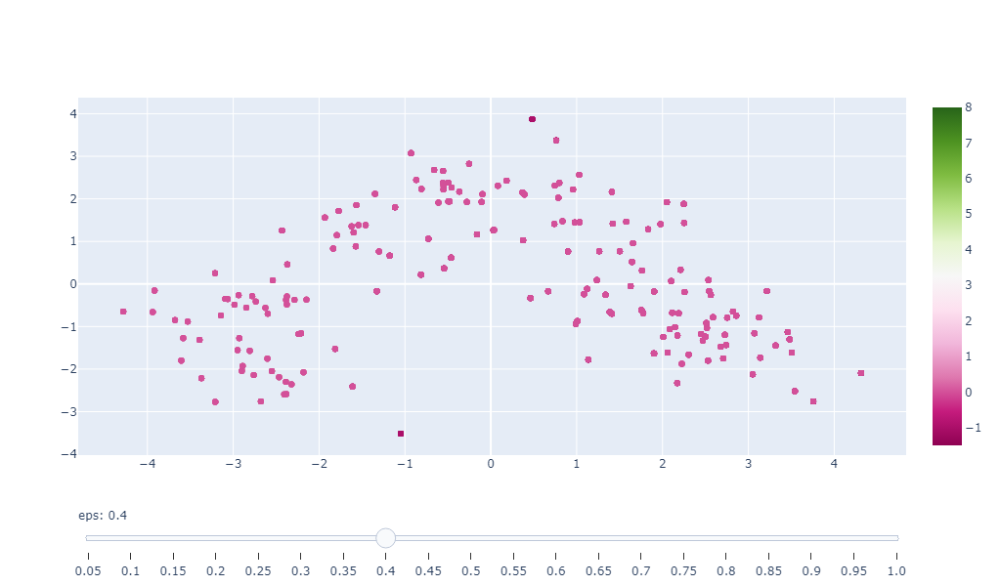

In [53]:
model_analyser(DBSCAN(), "eps", np.arange(0.05, 1.05, 0.05).round(2), X_pca_2d, n_dims = 2)

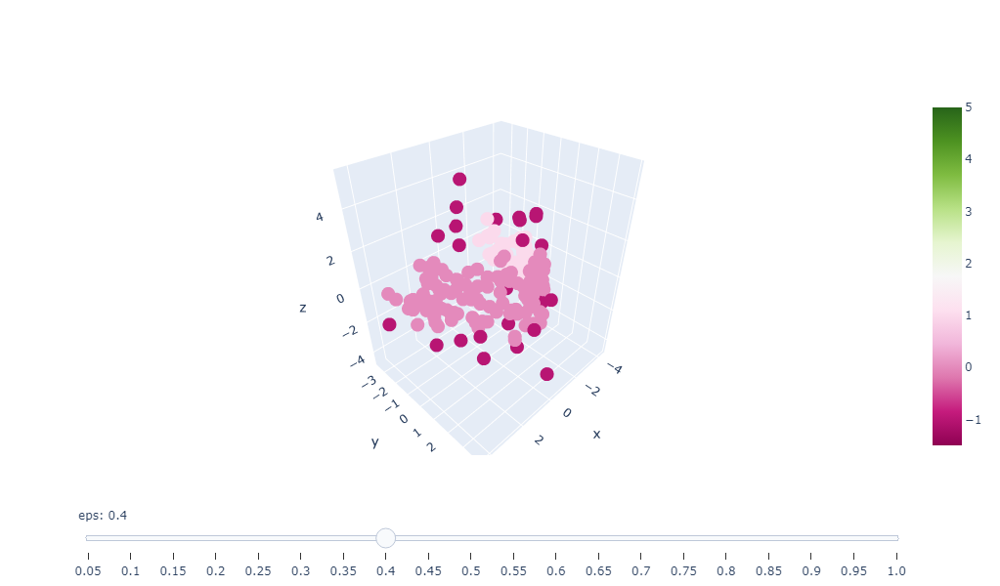

In [54]:
model_analyser(DBSCAN(), "eps", np.arange(0.05, 1.05, 0.05).round(2), X_pca_3d, n_dims = 3)

In [55]:
dbscan_2d, dbscan_clusters_2d = fit_model(DBSCAN(), {"eps": 0.55}, X_pca_2d)
dbscan_clusters_2d = Reorder_cluster_labels(dbscan_clusters_2d)

dbscan_3d, dbscan_clusters_3d = fit_model(DBSCAN(), {"eps": 0.85}, X_pca_3d)
dbscan_clusters_3d = Reorder_cluster_labels(dbscan_clusters_3d)

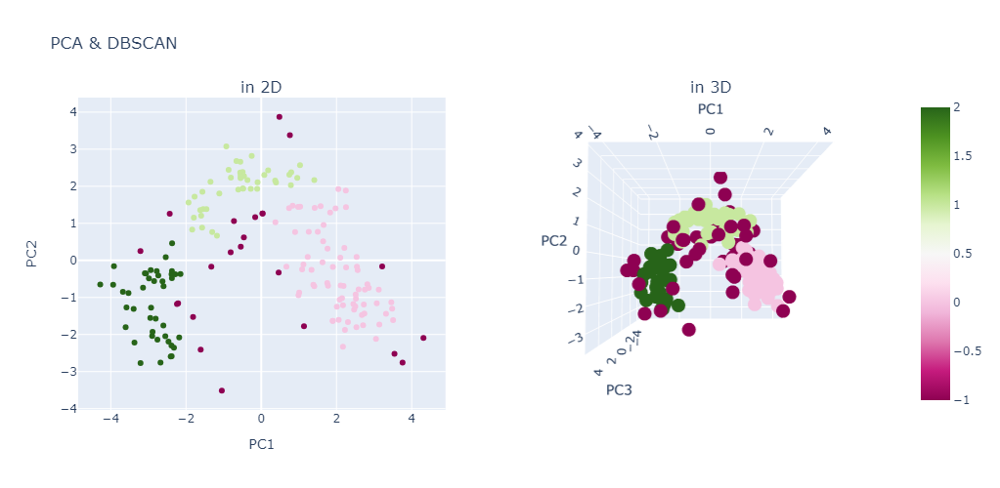

In [56]:
display_2d_3d_graphs(X_pca_2d, X_pca_3d, dbscan_clusters_2d, dbscan_clusters_3d, fig_title = "PCA & DBSCAN")

In [57]:
sil_score_2d = compute_sil_score(X_pca_2d, dbscan_2d)
print(f"Silhouette Score for PCA 2D & DBSCAN: {sil_score_2d}")

Silhouette Score for PCA 2D & DBSCAN: 0.41


In [58]:
sil_score_3d = compute_sil_score(X_pca_3d, dbscan_3d)
print(f"Silhouette Score for PCA 3D & DBSCAN: {sil_score_3d}")

Silhouette Score for PCA 3D & DBSCAN: 0.32


In [59]:
result_df = store_data_df(result_df, "PCA 2D", "DBSCAN", sil_score_2d, ms_clusters_2d)
result_df = store_data_df(result_df, "PCA 3D", "DBSCAN", sil_score_3d, ms_clusters_3d)

In [60]:
outlier_2d = np.where(dbscan_clusters_2d == -1)

print(outlier_2d)
print(len(outlier_2d[0]))

(array([  3,  14,  18,  43,  45,  50,  62,  68,  72,  80,  96, 102, 115,
       118, 123, 126, 130, 144, 152, 158, 159, 161, 170], dtype=int64),)
23


In [61]:
outlier_3d = np.where(dbscan_clusters_3d == -1)

print(outlier_3d)
print(len(outlier_3d[0]))

(array([  1,   3,   4,  14,  25,  27,  38,  41,  45,  50,  59,  61,  62,
        66,  68,  69,  71,  72,  73,  75,  76,  78,  79,  80,  87,  96,
        97,  98, 109, 112, 115, 118, 121, 122, 124, 127, 130, 136, 137,
       146, 152, 157, 158, 169, 177], dtype=int64),)
45


In [62]:
# Find similar noise points
set(outlier_2d[0]) & set(outlier_3d[0])

{3, 14, 45, 50, 62, 68, 72, 80, 96, 115, 118, 130, 152, 158}

The noise data captured by DBSCAN for both PCA 2D and PCA 3D is not the same. 

PCA 3D has more outliers than PCA 2D, and the similar data points are `3, 14, 45, 50, 62, 68, 72, 80, 96, 115, 118, 130, 152, 158`. For now we will continue with the analysis. We will deal with the outliers later.

## Clustering Analysis <a name = "cluster_analysis"/>

### Understanding silhouette score

In [63]:
result_df

,Dimensionality Reduction Technique,Clustering Algorithm,Silhouette Score,For 0,For 1,For 2,For 3,For 4,For 5,For 6,For 7,For 8,For 9,For 10,For 11,For 12,For 13,For 14,For 15,For 16,For 17,For 18,For 19,For 20,For 21,For 22,For 23,For 24,For 25,For 26,For 27,For 28,For 29,For 30,For 31,For 32,For 33,For 34,For 35,For 36,For 37,For 38,For 39,For 40,For 41,For 42,For 43,For 44,For 45,For 46,For 47,For 48,For 49,For 50,For 51,For 52,For 53,For 54,For 55,For 56,For 57,For 58,For 59,For 60,For 61,For 62,For 63,For 64,For 65,For 66,For 67,For 68,For 69,For 70,For 71,For 72,For 73,For 74,For 75,For 76,For 77,For 78,For 79,For 80,For 81,For 82,For 83,For 84,For 85,For 86,For 87,For 88,For 89,For 90,For 91,For 92,For 93,For 94,For 95,For 96,For 97,For 98,For 99,For 100,For 101,For 102,For 103,For 104,For 105,For 106,For 107,For 108,For 109,For 110,For 111,For 112,For 113,For 114,For 115,For 116,For 117,For 118,For 119,For 120,For 121,For 122,For 123,For 124,For 125,For 126,For 127,For 128,For 129,For 130,For 131,For 132,For 133,For 134,For 135,For 136,For 137,For 138,For 139,For 140,For 141,For 142,For 143,For 144,For 145,For 146,For 147,For 148,For 149,For 150,For 151,For 152,For 153,For 154,For 155,For 156,For 157,For 158,For 159,For 160,For 161,For 162,For 163,For 164,For 165,For 166,For 167,For 168,For 169,For 170,For 171,For 172,For 173,For 174,For 175,For 176,For 177
0,PCA 2D,K-Means,0.56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1,PCA 3D,K-Means,0.45,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
2,PCA 2D,AggloClust,0.56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
3,PCA 3D,AggloClust,0.45,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,1,1,0,1,1,1,0,1,1,1,1,0,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
4,PCA 2D,Mean Shift,0.56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
5,PCA 3D,Mean Shift,0.45,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
6,PCA 2D,DBSCAN,0.41,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,0,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2

Before we continue with analysing the results, Lets talk about `silhouette score`.

Earlier, we said that silhouette score is a metric used to calculate how close data points to its cluster, against other nearby clusters. Every data point is given a Silhouette Score from -1 to 1, with -1 being in the wrong cluster, and 1 being in the right cluster. The mean score for all data points is calculated and then returned as the `silhouette score`.

We can see that `K-means`, `Hierarchical Clustering` and `Mean Shift` gives us 0.56 (for 2D) and 0.45 (for 3D). Just by looking at the numbers, we may suggest that the score is too low and may readjust our preprocessing methods by for example, increasing the number of `n_components` in `PCA`. Also, silhouette score does not work well with noise, as seen by the noise in DBSCAN. DBSCAN's silhouette score is 0.41 (for 2D) and 0.32 (for 3D), lower than the other 3 models.

However, based on our domain knowledge of the dataset, we know that there are 3 different manufacturers. Our cluster algorithms did manage to converge into 3 different clusters. Therefore, we can assume that our models created are acceptable representations from the dataset.

### 'Ensemble' analysis

We have created 8 different models, with the use of PCA with 2 different number of components, and 4 clustering machine learning algorithms. We can do what is called an `ensemble method` in Machine Learning, which is to combine the result of multiple models as a collective output.

We will be taking the following steps below to finalise the data points to the clusters

<ol>
    <li>Create a new cluster labels dataframe</li>
    <ul>
        <li>This dataframe contains all data points, and the number of times it belongs to each cluster</li>
        <li>Columns would include the 4 different cluster labels: -1 for noise, 0, 1, 2</li>
        <li>Each model will have the same weightage with the rest of the models</li>
        <li>Note: This is only possible because we can see the data points are mostly having the similar cluster labels for each <b>DRT</b> and <b>CA</b></li>
    </ul>
    <li>Label each data point with cluster</li>
    <ul>
        <li>We can figure out the cluster for each data point, based on the highest (or mode) cluster label</li>
                <li>The labels will be on the original dataframe</li>
        <li>Note: In this lab, we will be ignoring noise labels, but an alternative is to remove the whole data point, if you prefer.</li>
    </ul>
    <li>Analyse data points in each clusters</li>
    <ul>
        <li>Univariate</li>
        <li>Multivariate</li>
    </ul>
</ol>

In [65]:
cluster_labels = [-1, 0, 1, 2]
label_df = pd.DataFrame(columns = cluster_labels)

adj_result_df = result_df.drop(["Dimensionality Reduction Technique", "Clustering Algorithm", "Silhouette Score"], axis = 1).T

for index, row in adj_result_df.iterrows():
    label_count_dict = row.value_counts().to_dict()
    
    for label in cluster_labels:
        if label not in label_count_dict:
            label_count_dict[label] = 0
    
    label_count_dict = dict(sorted(label_count_dict.items(), key = lambda x: x[0]))
    
    new_row = pd.DataFrame(data = label_count_dict, index = [0])
    label_df = pd.concat([label_df, new_row], axis = 0).reset_index(drop = True)
    
label_df.head()

,-1,0,1,2
0,0,8,0,0
1,0,8,0,0
2,0,8,0,0
3,0,8,0,0
4,0,8,0,0


Add a new column `Model label` to label the cluster

In [66]:
# Change column dtype from Object to integer for .idxmax()
label_df = label_df.astype(np.int64)

In [67]:
label_df["Mode label"] = label_df.idxmax(axis = 1)
label_df.head()

,-1,0,1,2,Mode label
0,0,8,0,0,0
1,0,8,0,0,0
2,0,8,0,0,0
3,0,8,0,0,0
4,0,8,0,0,0


Merge the `Mode label` in label_df to the original df for analysis

In [68]:
df["Cluster_Label"] = label_df["Mode label"]
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,Cluster_Label
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0


In [69]:
# Check that all rows are filled with clusters
df.isna().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
Cluster_Label           0
dtype: int64

### Analyse original dataset with cluster labels

In [70]:
# Set seaborn's colour palette for plots below
sns.set_palette("Set2")

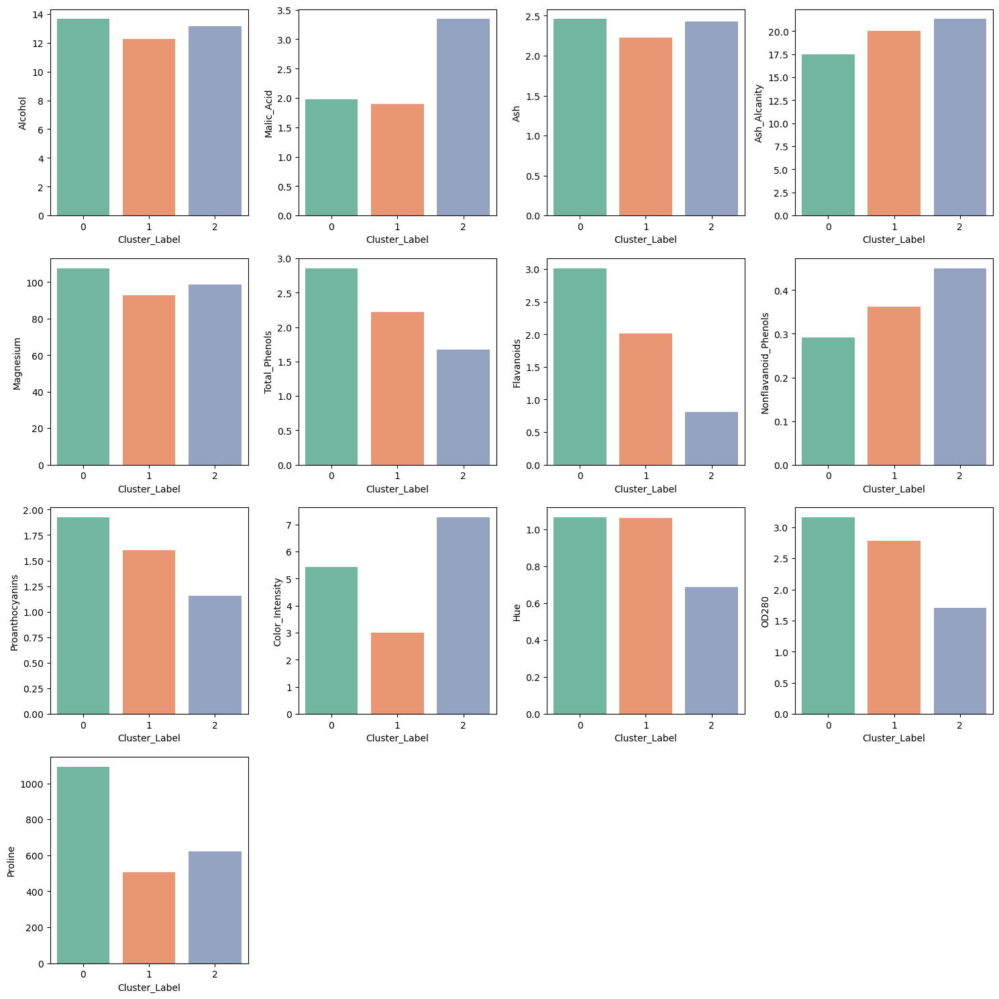

In [71]:
fig, axList = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 15))

axList = axList.flatten()

# Hide unused plots
for axFig in axList[-3:]:
    axFig.set_visible(False)

for axFig, col in zip(axList, df.columns[:-1]):
    sns.barplot(data = df, x = "Cluster_Label", y = col, ax = axFig, errorbar = None)
    
    plt.xlabel("Cluster Label")
    
plt.tight_layout()
plt.show()

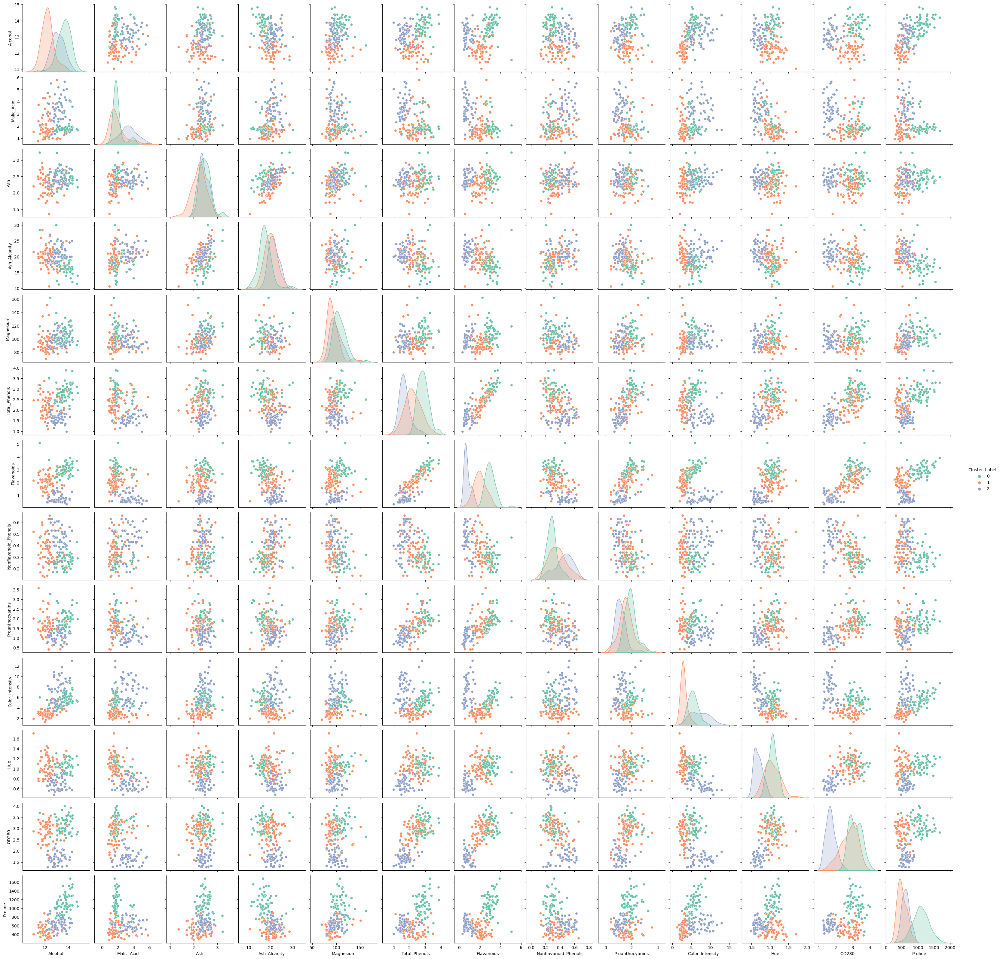

In [72]:
sns.pairplot(df, hue = "Cluster_Label", palette = "Set2")

Below are highlights of <b>some</b> information we can take from our univariate and bivariate analysis.

Bioactive molecules and minerals found in grapes
- Wines in Cluster 2 (Blue) contains a higher amount of `Malic acid` compared to the other 2 clusters.
- Wines in Cluster 0 (Green) contains more `flavanoids` and `phenols`, as compared to the other 2 clusters, with cluster 2 being the lowest.
- As such, cluster 2 has the highest amount of `Non-flavanoids and phenols`.
- Wines in Cluster 0 (Green) has the highest amount of `Proline`,`Proathocyains` and protein concentration `OD280`

Color_Intensity and Hue
- Cluster 2 (Blue) has the highest `color intensity` and the lowest `hue`.
- This is followed by Cluster 0 (Green), and then Cluster 1 (Orange), with Cluster 1 having the highest hue but lowest `color intensity`

Cluster 1 (Orange) tends to have a lower `alcoholic` value compared to the other 2 clusters.

There is not much separation in clusters for Ash, Ash Alkalinity and Magnesium.

## Conclusion <a name = "conclusion"/>

Based on our analysis, we have identified the wines belonging to the 3 different manufacturers in Italy, with the help of clustering techniques. We have made some conclusions between the 3 clusters. Each cluster has a certain amount of uniqueness, which shows the 3 different manufacturers making a multitude of wine options to hopefully attract more consumers.

We took a step-by-step process to achieve our findings. Firstly, we pre-processed the dataset using `StandardScaler` and `PCA`. This helps us  reduce the number of dimensions, which allows us to create visualisation graphs for analysing the data points and clusters. In this lab, we took 2 different PCAs, one with 2 dimensions and another 3 dimensions. Next, we used 4 different models `K-Means`, `Hierarchical Clustering`, `Mean Shift` and `DBSCAN` to cluster the dataset.

Throughout the clustering, we were able to visualise the 3 different clusters, with the help of `Plotly`. This came in handy, especially during density-based clustering, where we were not able to specify the number of clusters. We created interactive plotly graphs that show how different hyperparameter values affect the way the model converges into the different clusters, and used that knowledge to correctly select our hyperparameter values. Also, while `K-Means`, `Hierarchical Clustering` and `Mean Shift` clustered all data points, `DBSCAN` was able to pick some data points as noise. This resulted in a poorer `Silhouette Score` as compared to the other models. However, through domain knowledge, we were able to identify that our score is still acceptable, and we did not remove any noise data points.

With a total of 8 models (2 PCA * 4 models), we combined our cluster label findings, choosing only the cluster label that appears most. Finally, we brought cluster labels for each data point/wine instance, back to the original dataset for analysis.

### What's Next?

- Perform more dimensionality reduction techniques, to uncover more and different clusters within the data points:
    - Kernel Principal Component Analysis (KPCA)
        - Similar to PCA, but is a non-linear dimensionality reduction technique, with the use of kernel trick
        - Non-linear techniques work better when features are not linearly correlated
    - t-distributed Stochastic Neighbour Embedding (t-SNE)
        - Another non-linear dimensionality reduction technique, but takes a stochastic approach 
            - (i.e. results may differ everytime)
        - Uses probability distributions to reduce dimensions, while trying to group similar data points together
    - Uniform Manifold Approximation and Projection (UMAP)
        - Also another non-linear dimensionality reduction technique
        - Aims to preserve both local/global structures by mapping the dataset into a topological representation to show the relationships of data points
- Noise data points
    - We did not isolate data points classified as noise through DBSCAN
    - Therefore, more analysis can also be made, such as removing these data points from the analysis
- Silhouette Score
    - As some may argue that the silhouette score of 0.45 and 0.56 is not high based on value and domain knowledge, methods like adjusting our preprocessing steps can be done to hopefully increase the score.